#Wine Quality using Pycaret

In [1]:
%cd ..
from google.colab import drive
drive.mount('/content/gdrive')

/
Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
# rename the path 
!ln -s /content/gdrive/My\ Drive/ /mydrive
!ls /mydrive

ln: failed to create symbolic link '/mydrive/My Drive': File exists
'Android studio'	'Eclipse works'  'Processo seletivo - Fab'
 AshProkemon.rar	'My Drive'	 'Segundo trabalho CG'
'Colab Notebooks'	 Pessoal	  Tese
 Data_Science_Projects	'Power BI'	 'Variados TCC'


In [3]:
!ls /mydrive/Data_Science_Projects/Wine_Quality/data


data.csv  winequality.csv


In [4]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

In [5]:
path = '/mydrive/Data_Science_Projects/Wine_Quality/data/'

df = pd.read_csv(path + 'winequality.csv')
df.head(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [7]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


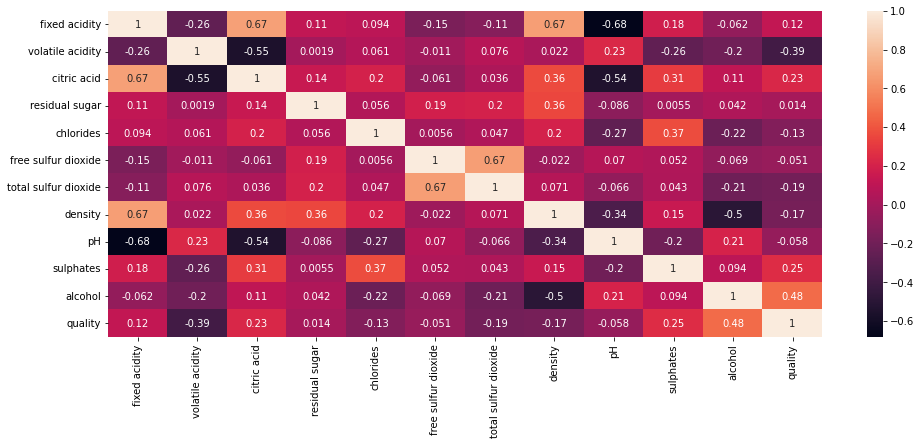

In [8]:
#correlation
corr = df.corr()

#seaborn heatmap method
plt.figure(figsize=[16,6])
sns.heatmap(data=corr, annot=True)

In [9]:
!install pandas profilling
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

install: cannot stat 'pandas': No such file or directory
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip (25.9 MB)


In [ ]:
# import pandas profilling
from pandas_profiling import ProfileReport

# run profile
profile = ProfileReport(df, title = 'Report - Pandas Profilling', html={'style': {'full_width': True}})
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##Machine Learning

In [10]:
# rename columns
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [11]:
df.rename(columns={'fixed acidity':'fixed_acidity','volatile acidity': 'volatile_acidity', 'citric acid':'citric_acid', 'residual sugar':'residual_sugar', 'free sulfur dioxide':'free_sulfur_dioxide', 'total sulfur dioxide':'total_sulfur_dioxide'}, inplace = True)

In [12]:
df.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

###Pycaret

In [13]:
!pip install pycaret pandas shap

In [14]:

from pycaret.regression import *

numeric_feature = ['fixed_acidity',	'volatile_acidity',	'citric_acid',	'residual_sugar',	'chlorides',	'free_sulfur_dioxide',	'total_sulfur_dioxide',	'density',	'pH',	'sulphates',	'alcohol',	'quality']

In [15]:
df.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [16]:
exp = setup(data = df, target = 'quality')

,Description,Value
0,session_id,4773
1,Target,quality
2,Original Data,"(1599, 12)"
3,Missing Values,False
4,Numeric Features,11
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(1119, 11)"


In [17]:
model = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.4057,0.3507,0.5905,0.4783,0.0922,0.0755,0.523
rf,Random Forest Regressor,0.4425,0.3778,0.6127,0.4411,0.0957,0.0824,0.740
lightgbm,Light Gradient Boosting Machine,0.4511,0.3941,0.6259,0.4153,0.0977,0.0837,0.127
gbr,Gradient Boosting Regressor,0.4846,0.4089,0.6380,0.3914,0.0992,0.0893,0.171
ada,AdaBoost Regressor,0.5180,0.4245,0.6506,0.3680,0.1007,0.0952,0.140
lr,Linear Regression,0.5137,0.4416,0.6630,0.3420,0.1026,0.0947,0.357
ridge,Ridge Regression,0.5153,0.4433,0.6642,0.3406,0.1028,0.0949,0.016
br,Bayesian Ridge,0.5154,0.4437,0.6645,0.3399,0.1028,0.0950,0.017
huber,Huber Regressor,0.5136,0.4511,0.6696,0.3324,0.1037,0.0949,0.065
lar,Least Angle Regression,0.5252,0.4622,0.6770,0.3148,0.1048,0.0967,0.019


In [18]:
#list of models
models()

,Name,Reference,Turbo
ID,,,
lr,Linear Regression,sklearn.linear_model._base.LinearRegression,True
lasso,Lasso Regression,sklearn.linear_model._coordinate_descent.Lasso,True
ridge,Ridge Regression,sklearn.linear_model._ridge.Ridge,True
en,Elastic Net,sklearn.linear_model._coordinate_descent.Elast...,True
lar,Least Angle Regression,sklearn.linear_model._least_angle.Lars,True
llar,Lasso Least Angle Regression,sklearn.linear_model._least_angle.LassoLars,True
omp,Orthogonal Matching Pursuit,sklearn.linear_model._omp.OrthogonalMatchingPu...,True
br,Bayesian Ridge,sklearn.linear_model._bayes.BayesianRidge,True
ard,Automatic Relevance Determination,sklearn.linear_model._bayes.ARDRegression,False


In [19]:
# best model 
et = create_model('et')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.4543,0.3784,0.6151,0.5167,0.0916,0.0802
1,0.4071,0.3512,0.5926,0.5467,0.0896,0.0729
2,0.4002,0.3199,0.5656,0.3746,0.0857,0.0725
3,0.4262,0.4208,0.6487,0.5180,0.1094,0.0864
4,0.3150,0.2436,0.4936,0.6258,0.0819,0.0618
5,0.4228,0.4045,0.6360,0.4536,0.1051,0.0833
6,0.4227,0.3508,0.5923,0.3535,0.0902,0.0759
7,0.4260,0.3975,0.6305,0.4086,0.0957,0.0777
8,0.3971,0.3073,0.5543,0.4895,0.0848,0.0729
9,0.3855,0.3326,0.5767,0.4956,0.0879,0.0715


In [20]:
print(et)

ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=4773, verbose=0, warm_start=False)


In [21]:
turned_model = tune_model(et)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.5349,0.4377,0.6616,0.4409,0.0989,0.0953
1,0.5034,0.4227,0.6502,0.4544,0.1000,0.0915
2,0.5025,0.3801,0.6166,0.2567,0.0946,0.0914
3,0.5329,0.5083,0.7129,0.4178,0.1183,0.1063
4,0.4650,0.3413,0.5842,0.4758,0.0946,0.0884
5,0.5113,0.4539,0.6737,0.3870,0.1108,0.0997
6,0.4920,0.3570,0.5975,0.3421,0.0911,0.0885
7,0.5359,0.4602,0.6784,0.3152,0.1023,0.0968
8,0.4753,0.3539,0.5949,0.4121,0.0893,0.0845
9,0.5297,0.4321,0.6573,0.3447,0.0978,0.0943


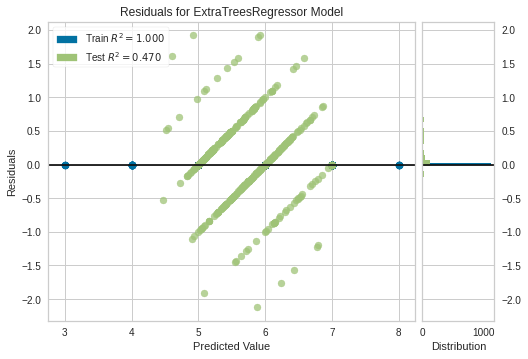

In [22]:
# viewing the residuals
plot_model(et)

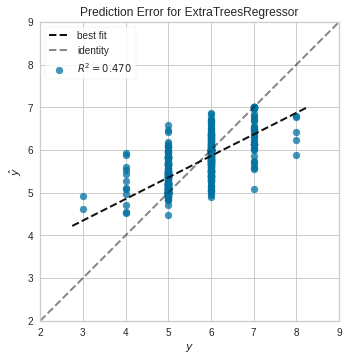

In [23]:
# vizualize the error
plot_model(et, plot='error')

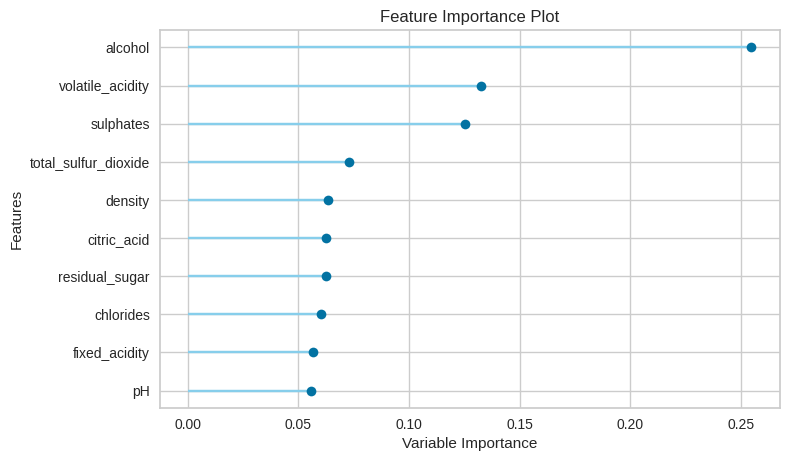

In [24]:
plot_model(et, plot='feature')

In [25]:
finalize_et = finalize_model(et)

In [26]:
save_model(finalize_et, 'model')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[], target='quality',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strategy...
                  ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0,
                                      criterion='mse', max_depth=None,
                                      max_features='auto', max_leaf_nodes=None,
                                      max_samples=None,
                                    

In [27]:
!ls

bin	 dev   lib32	 mnt	    proc	sbin		   tmp
boot	 etc   lib64	 model.pkl  python-apt	srv		   tools
content  home  logs.log  mydrive    root	sys		   usr
datalab  lib   media	 opt	    run		tensorflow-1.15.2  var


In [28]:
df.to_csv('//mydrive/Data_Science_Projects/Wine_Quality/data/data.csv', index=False)